$\Large\color{blue}{\text{PyGMTSAR Yamchi Dam Sentinel-1 SLC Timeseries Analysis}}$

$\Large\color{blue}{\text{Scenes on Alaska Satellite Facility (ASF) for POINT(48.0768 38.3)}}$

See
http://mgviz.ucsd.edu/?mission=ESESES

https://github.com/gmtsar/2022-unavco-course-gmtsar/blob/main/Jupyter/gmtsar_correcting_intf_with_gps_example.ipynb

http://geodesy.unr.edu/NGLStationPages/gpsnetmap/GPSNetMap.html

https://topex.ucsd.edu/gmtsar/tar/sentinel_time_series_4.pdf

https://search.asf.alaska.edu/

### See and more PyGMTSAR notebooks on GitHub: [PyGMTSAR](https://github.com/mobigroup/gmtsar)

It works on

* MacOS Monterey (Apple Silicon) and BigSur (Intel) (Python 3.9) - please pre-install system dependencies (maybe using HomeBrew),

* Google Cloud VM and Notebooks on Debian 10 (Python 3.7), use the [Google Cloud Debian 10 init script](https://github.com/mobigroup/gmtsar/blob/master/gmtsar/sh/GMTSAR.install.debian10.sh) and [Google Cloud Debian 10 VM creation script](https://github.com/mobigroup/gmtsar/blob/master/gmtsar/sh/GMTSAR.gcloud_create_debian10.sh)

* $\color{red}{\text{Google Colab (Python 3.7) - you will be asked to re-run the notebook once due to "system crash" by desing}}$
$\color{red}{\text{Note: to open all notebook cells select menu "View" -> "Expand Sections"}}$

### PyGMTSAR is my free-time Open Source project.

That's a bit curious how the project was started a year ago. I develop geophysical inversion methods and processing software for many years using my fundamental physics and mathematics background. Satellite interferometry is the key point to validate my inversion models and I found the same problem as you too that the existing interferometry packages usage is a pain. There is no interactive processing with multiprocessing and even a progressbar and ability to view and change every step code and validate the results. Also, many used algorithms are too outdated and produce terrible results like to tension surfaces in GMT which is used widely in GMTSAR (hmm, how about to control a smothness of derivative? Tension surfaces were invented when all the Earths computers where less powerfull than your smarthone today. If you are interested I shared the examples in GMTSAR bug tracker). Anyway, I found GMT mathematics is really crazy and the developers replace one incorrect algorithm by another and back often as we see in the codes and the changelog). That was enough reason to check all the used algorithms and replace these by modern and correct ones. By this way, I use only GMTSAR C codes with my patches to fix some errors and allow interoperability with Python wrappers plus my own codes around them. GMTSAR codes are fine and without crazy GMT codes work better and the processing is much faster. Alright, I spent one month to make the initial PyGMTSAR realization and it works. Recently, I returned to the project to add some more sophisticated features like to scenes and subswathes stitching. I'm going to share some of my geological exprorations and seismic models as live examples on Google Colab as soon as it will be possible to do. How lineaments and ore zones are related to interferograms? How gas and oil deposits are related to surface movements on interferometry displacement maps? I have the answer and I work on the tools to model and visualize them.

You'd find my theoretical models and processing codes foir geophisical inversions in Github repository https://github.com/mobigroup/gis-snippets and tools for the 4D results vizualization in https://github.com/mobigroup/ParaView-plugins

Ah yes, a little bit about me. I have STEM master's degree in radio physics and in 2004 I was awarded first prize of the All-Russian Physics competition for significant results in Inverse modeling for non-linear optics and holography, also applicable for Inverse Modeling of Gravity, Magnetic, and Thermal fields. In addition to my fundamental science knowledge, I’m world class data scientist and software developer with 20 years experience in science and industrial development. I have worked on government contracts and universities projects and on projects for LG Corp, Google Inc, etc. You are able to find some of my software and results on LinkedIn and GitHub and Upwork. By the way, I left Russia many years ago and I work remotely for about 20 years.

### To order some research, development and support see my profile on freelance platform [Upwork](https://www.upwork.com/freelancers/~01e65e8e7221758623)

### @ Alexey Pechnikov, August, 2022

[Geological models on YouTube channel](https://www.youtube.com/channel/UCSEeXKAn9f_bDiTjT6l87Lg)

[Augmented Reality (AR) Geological Models](https://mobigroup.github.io/ParaView-Blender-AR/)

[GitHub repositories](https://github.com/mobigroup)

[English posts and articles on LinkedIn](https://www.linkedin.com/in/alexey-pechnikov/)

[Russian articles on Habr](https://habr.com/ru/users/N-Cube/posts/)

## Load Modules to Check Environment

In [1]:
import platform, sys, os

## Load and Setup Python Modules

In [2]:
import xarray as xr
import numpy as np
import pandas as pd
import geopandas as gpd
import shapely
# supress numpy warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
# plotting modules
import hvplot.pandas  # noqa
import hvplot.xarray  # noqa
import holoviews as hv
pd.options.plotting.backend = 'hvplot'
from IPython.display import Image
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

In [4]:
# define Pandas display settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

## Load Custom Python Modules

In [5]:
from pygmtsar import SBAS

## Define 3 Sentinel-1 Scenes and Processing Parameters

When you need more scenes and SBAS analysis  see examples on PyGMTSAR GitHub page https://github.com/mobigroup/gmtsar

### Descending Orbit Configuration

### Ascending Orbit Configuration

In [6]:
DATADIR   = '/Volumes/DISK/work/Yamchi/data/asc/2020'
ORBIT     = 'A'
SUBSWATH  = 2
# or '2019-10-22'
MASTER = '2020-08-17'

## Common Configuration

In [7]:
BACKUP       = 'backup_asc' if ORBIT == 'A' else 'backup_desc'
WORKDIR      = 'raw_asc' if ORBIT == 'A' else 'raw_desc'
DEMFILE      = None
POLARIZATION = 'VV'
# SBAS parameters
BASEDAYS     = 65
BASEMETERS   = 150

## AOI

Use GeoJSON file or shapefile or define the area by points as below.

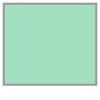

In [8]:
# define AOI using two points
AOI = shapely.geometry.LineString([shapely.geometry.Point(47.85,38.20), shapely.geometry.Point(48.25,37.85)]).envelope
AOI

In [9]:
# save to GeoJSON file
gpd.GeoSeries([AOI]).to_file('AOI.geojson', driver='GeoJSON')

### Reuse Backup Dataset If Exists

Use backup/restore feature for reproducible runs when the original large dataset is cropped to the minimal one to save disk space significantly.

In [10]:
#if os.path.isdir(BACKUP):
#    print ('Found backup dataset, use it instead of the fresh run full scenes downloading from ASF datastore')
#    DATADIR      = BACKUP
#    DEMFILE      = f'{BACKUP}/DEM_WGS84.nc'

## Run Local Dask Cluster

For multicore processing of the all big rasters launch Dask cluster

In [11]:
from dask.distributed import Client
client = Client()

2022-09-25 16:01:36,643 - distributed.diskutils - INFO - Found stale lock file and directory '/var/folders/r9/myjqk4417vsbrknw1cnwld780000gn/T/dask-worker-space/worker-xv3m8z8j', purging
2022-09-25 16:01:36,644 - distributed.diskutils - INFO - Found stale lock file and directory '/var/folders/r9/myjqk4417vsbrknw1cnwld780000gn/T/dask-worker-space/worker-9v7pbk42', purging
2022-09-25 16:01:36,644 - distributed.diskutils - INFO - Found stale lock file and directory '/var/folders/r9/myjqk4417vsbrknw1cnwld780000gn/T/dask-worker-space/worker-lyhfv63b', purging
2022-09-25 16:01:36,644 - distributed.diskutils - INFO - Found stale lock file and directory '/var/folders/r9/myjqk4417vsbrknw1cnwld780000gn/T/dask-worker-space/worker-7pihc1sl', purging


## Init SBAS

In [12]:
sbas = SBAS(DATADIR, DEMFILE, basedir=WORKDIR,
    filter_orbit=ORBIT,
    filter_subswath=SUBSWATH,
    filter_polarization=POLARIZATION)
if MASTER is not None:
    sbas.set_master(MASTER)

NOTE: Found multiple scenes for a single day, use function SBAS.reframe() to stitch the scenes
NOTE: Please follow all the notes listed above


In [13]:
sbas.to_dataframe()

,datetime,orbit,mission,polarization,subswath,datapath,metapath,orbitpath,geometry
date,,,,,,,,,
2020-01-02,2020-01-02 14:44:56,A,S1A,VV,2,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200102T144455_20200102T144523_030623_03823A_4460.SAFE/measurement/s1a-iw2-slc-vv-20200102t144456-20200102t144521-030623-03823a-005.tiff,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200102T144455_20200102T144523_030623_03823A_4460.SAFE/annotation/s1a-iw2-slc-vv-20200102t144456-20200102t144521-030623-03823a-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210316T184157_V20200101T225942_20200103T005942.EOF,"POLYGON ((47.46451 39.30777, 47.84950 37.54856, 48.93133 37.78531, 48.54634 39.54452, 47.46451 39.30777))"
2020-01-14,2020-01-14 14:44:55,A,S1A,VV,2,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200114T144454_20200114T144522_030798_03885A_B781.SAFE/measurement/s1a-iw2-slc-vv-20200114t144455-20200114t144520-030798-03885a-005.tiff,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200114T144454_20200114T144522_030798_03885A_B781.SAFE/annotation/s1a-iw2-slc-vv-20200114t144455-20200114t144520-030798-03885a-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210316T223042_V20200113T225942_20200115T005942.EOF,"POLYGON ((47.46432 39.30797, 47.84929 37.54877, 48.93112 37.78551, 48.54615 39.54471, 47.46432 39.30797))"
2020-01-26,2020-01-26 14:44:55,A,S1A,VV,2,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200126T144454_20200126T144522_030973_038E84_2585.SAFE/measurement/s1a-iw2-slc-vv-20200126t144455-20200126t144520-030973-038e84-005.tiff,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200126T144454_20200126T144522_030973_038E84_2585.SAFE/annotation/s1a-iw2-slc-vv-20200126t144455-20200126t144520-030973-038e84-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T022152_V20200125T225942_20200127T005942.EOF,"POLYGON ((47.46517 39.30759, 47.85009 37.54841, 48.93162 37.78506, 48.54670 39.54424, 47.46517 39.30759))"
2020-02-07,2020-02-07 14:44:55,A,S1A,VV,2,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200207T144454_20200207T144521_031148_03949F_610B.SAFE/measurement/s1a-iw2-slc-vv-20200207t144455-20200207t144520-031148-03949f-005.tiff,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200207T144454_20200207T144521_031148_03949F_610B.SAFE/annotation/s1a-iw2-slc-vv-20200207t144455-20200207t144520-031148-03949f-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T061343_V20200206T225942_20200208T005942.EOF,"POLYGON ((48.92003 37.78443, 48.57084 39.38058, 47.50996 39.14850, 47.85914 37.55235, 48.92003 37.78443))"
2020-02-19,2020-02-19 14:44:54,A,S1A,VV,2,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200219T144453_20200219T144521_031323_039AAC_A9AB.SAFE/measurement/s1a-iw2-slc-vv-20200219t144454-20200219t144519-031323-039aac-005.tiff,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200219T144453_20200219T144521_031323_039AAC_A9AB.SAFE/annotation/s1a-iw2-slc-vv-20200219t144454-20200219t144519-031323-039aac-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T100523_V20200218T225942_20200220T005942.EOF,"POLYGON ((48.91966 37.78403, 48.57044 39.38019, 47.50958 39.14808, 47.85880 37.55193, 48.91966 37.78403))"
2020-03-02,2020-03-02 14:44:54,A,S1A,VV,2,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200302T144453_20200302T144521_031498_03A0AF_5092.SAFE/measurement/s1a-iw2-slc-vv-20200302t144454-20200302t144519-031498-03a0af-005.tiff,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200302T144453_20200302T144521_031498_03A0AF_5092.SAFE/annotation/s1a-iw2-slc-vv-20200302t144454-20200302t144519-031498-03a0af-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T135251_V20200301T225942_20200303T005942.EOF,"POLYGON ((48.91937 37.78395, 48.56998 39.38072, 47.50913 39.14860, 47.8585

## Additional Data Filtering

In [14]:
# select scenes for the date range
#sbas.df = sbas.df.query('"2017-11-10" <= index <= "2017-11-20"')
#sbas.df

In [15]:
# select first 6 dates only for all subswaths
#sbas.df = sbas.df[[idx in sbas.df.index[:6] for idx in sbas.df.index]]
#sbas.df

### Download Sentinel-1 Orbits

In [16]:
# also, we can place pre-downloaded orbit files to data directory 
sbas.download_orbits()

In [17]:
sbas.to_dataframe()

,datetime,orbit,mission,polarization,subswath,datapath,metapath,orbitpath,geometry
date,,,,,,,,,
2020-01-02,2020-01-02 14:44:56,A,S1A,VV,2,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200102T144455_20200102T144523_030623_03823A_4460.SAFE/measurement/s1a-iw2-slc-vv-20200102t144456-20200102t144521-030623-03823a-005.tiff,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200102T144455_20200102T144523_030623_03823A_4460.SAFE/annotation/s1a-iw2-slc-vv-20200102t144456-20200102t144521-030623-03823a-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210316T184157_V20200101T225942_20200103T005942.EOF,"POLYGON ((47.46451 39.30777, 47.84950 37.54856, 48.93133 37.78531, 48.54634 39.54452, 47.46451 39.30777))"
2020-01-14,2020-01-14 14:44:55,A,S1A,VV,2,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200114T144454_20200114T144522_030798_03885A_B781.SAFE/measurement/s1a-iw2-slc-vv-20200114t144455-20200114t144520-030798-03885a-005.tiff,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200114T144454_20200114T144522_030798_03885A_B781.SAFE/annotation/s1a-iw2-slc-vv-20200114t144455-20200114t144520-030798-03885a-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210316T223042_V20200113T225942_20200115T005942.EOF,"POLYGON ((47.46432 39.30797, 47.84929 37.54877, 48.93112 37.78551, 48.54615 39.54471, 47.46432 39.30797))"
2020-01-26,2020-01-26 14:44:55,A,S1A,VV,2,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200126T144454_20200126T144522_030973_038E84_2585.SAFE/measurement/s1a-iw2-slc-vv-20200126t144455-20200126t144520-030973-038e84-005.tiff,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200126T144454_20200126T144522_030973_038E84_2585.SAFE/annotation/s1a-iw2-slc-vv-20200126t144455-20200126t144520-030973-038e84-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T022152_V20200125T225942_20200127T005942.EOF,"POLYGON ((47.46517 39.30759, 47.85009 37.54841, 48.93162 37.78506, 48.54670 39.54424, 47.46517 39.30759))"
2020-02-07,2020-02-07 14:44:55,A,S1A,VV,2,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200207T144454_20200207T144521_031148_03949F_610B.SAFE/measurement/s1a-iw2-slc-vv-20200207t144455-20200207t144520-031148-03949f-005.tiff,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200207T144454_20200207T144521_031148_03949F_610B.SAFE/annotation/s1a-iw2-slc-vv-20200207t144455-20200207t144520-031148-03949f-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T061343_V20200206T225942_20200208T005942.EOF,"POLYGON ((48.92003 37.78443, 48.57084 39.38058, 47.50996 39.14850, 47.85914 37.55235, 48.92003 37.78443))"
2020-02-19,2020-02-19 14:44:54,A,S1A,VV,2,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200219T144453_20200219T144521_031323_039AAC_A9AB.SAFE/measurement/s1a-iw2-slc-vv-20200219t144454-20200219t144519-031323-039aac-005.tiff,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200219T144453_20200219T144521_031323_039AAC_A9AB.SAFE/annotation/s1a-iw2-slc-vv-20200219t144454-20200219t144519-031323-039aac-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T100523_V20200218T225942_20200220T005942.EOF,"POLYGON ((48.91966 37.78403, 48.57044 39.38019, 47.50958 39.14808, 47.85880 37.55193, 48.91966 37.78403))"
2020-03-02,2020-03-02 14:44:54,A,S1A,VV,2,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200302T144453_20200302T144521_031498_03A0AF_5092.SAFE/measurement/s1a-iw2-slc-vv-20200302t144454-20200302t144519-031498-03a0af-005.tiff,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_IW_SLC__1SDV_20200302T144453_20200302T144521_031498_03A0AF_5092.SAFE/annotation/s1a-iw2-slc-vv-20200302t144454-20200302t144519-031498-03a0af-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T135251_V20200301T225942_20200303T005942.EOF,"POLYGON ((48.91937 37.78395, 48.56998 39.38072, 47.50913 39.14860, 47.8585

## Reframe Scenes (Optional)

### Define Pair of Pins for Each Subswath (Optional)

BACKUP directory stores already cropped scenes so miss the pinning to prevent useless reframing

In [18]:
if DATADIR != BACKUP and ORBIT == 'A':
    # example for three subswaths on Abdabil and Yamchi area:
    #sbas.set_pins([47.5, 38-0.2, 47.5, 39-0.2], [48.5, 38, 48.5, 39], [49.5, 38+0.2, 49.5, 39+0.2])
    # example for two subswaths 12 on Abdabil and Yamchi area:
    #sbas.set_pins([47.5, 37.8, 47.5, 38.3], [48.5, 38, 48.5, 38.5])

    # just miss the function call or run it without arguments to auto-pinning
    #sbas.set_pins(pins)

    # 3rd subswath is mainly outside of land
    #sbas.set_pins([47.5, 38, 47.5, 38.5], [48.5, 38, 48.5, 38.5])
    # 2nd subswath is Yamchi dam area
    sbas.set_pins([48.5, 38, 48.5, 38.3])

if DATADIR != BACKUP and ORBIT == 'D':
    sbas.set_pins([48.5, 37.8, 48.5, 38.1], [47.5, 38, 47.5, 38.3])

In [19]:
# for the full scene
#sbas.set_pins()

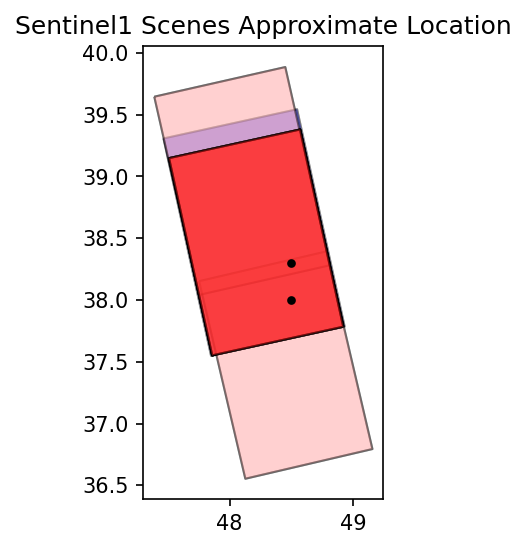

In [20]:
plt.figure(figsize=(8,4), dpi=150)
gdf =sbas.to_dataframe()
cmap = plt.cm.get_cmap('bwr', len(gdf.index.unique()))
colors = dict([(v,cmap(k)) for k,v in enumerate(gdf.index.unique())])
gdf.reset_index().plot(color=[colors[k] for k in gdf.index], alpha=0.2, edgecolor='black', ax=plt.gca())
plt.scatter(x=sbas.get_pins()[::2], y=sbas.get_pins()[1::2], color='black', s=10)
plt.title('Sentinel1 Scenes Approximate Location', fontsize=12)
plt.show()

### Crop the Frame (Optional)

In [21]:
sbas.reframe_parallel()

Reframing:   0%|          | 0/31 [00:00<?, ?it/s]

In [22]:
#sbas.to_dataframe()

### Download SRTM DEM

The DEM resolution is equal to the output geocoded resolution so select it carefully. Usually 60 meters resolution is enough. For fast check use 90 or 120 meters resolution. Internal processing resolution is about 15m and it can be decimated using post-processing function on interferogram processing step.

In [24]:
if platform.system() == 'Darwin':
    # this command allows to download DEM for a large area and faster
    # requires GMT 6.1+ and it does not work on Google Colab
    sbas.download_dem(backend='GMT', resolution_meters=30)
else:
    # for old Linux Debian and Ubuntu use default backend to download SRTM3 DEM for large areas (4°x4° and more)
    #sbas.download_dem(product='SRTM3')
    # for old Linux Debian and Ubuntu use default backend to download SRTM1 DEM for small areas (less than 4°x4°)
    sbas.download_dem(product='SRTM1', resolution_meters=60)

DEM Downloading:   0%|          | 0/1 [00:00<?, ?it/s]

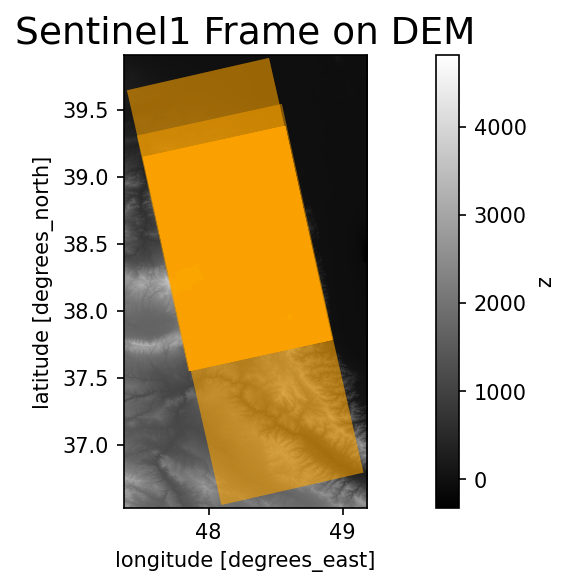

In [25]:
plt.figure(figsize=(12,4), dpi=150)
dem = sbas.get_dem()[::4,::4]
dem.plot.imshow(cmap='gray', vmin=dem.min(), vmax=dem.max())
sbas.to_dataframe().plot(color='orange', alpha=0.2, ax=plt.gca())
plt.title('Sentinel1 Frame on DEM', fontsize=18)
plt.show()

## Align Pairs of Images

In [26]:
sbas.stack_parallel()

Reference:   0%|          | 0/1 [00:00<?, ?it/s]

Aligning:   0%|          | 0/30 [00:00<?, ?it/s]

## DEM in Radar Coordinates

In [27]:
sbas.topo_ra_parallel()

Transforming Coordinates:   0%|          | 0/1 [00:00<?, ?it/s]

In [28]:
topo_ra = sbas.get_topo_ra()
# unify a single subswath processing and multiple ones
topo_ra = topo_ra if isinstance(topo_ra, list) else [topo_ra]

Topography range and azimuth decimation: 2/2


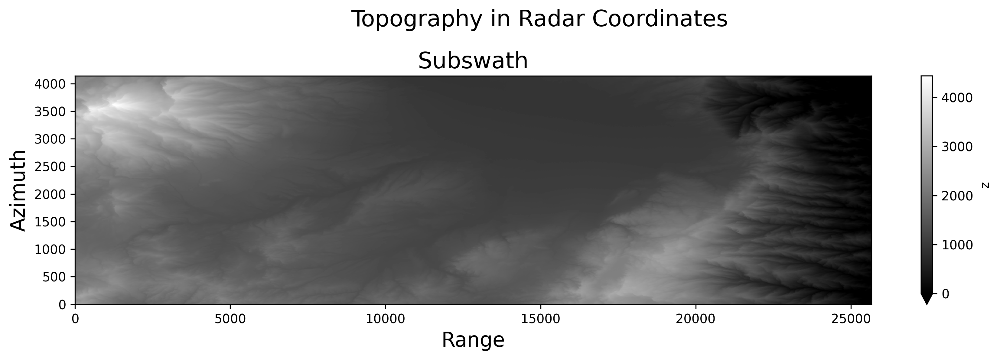

In [29]:
fig = plt.figure(figsize=(12,4), dpi=300)
subswaths = len(topo_ra)
for subswath in range(subswaths):
    ax = fig.add_subplot(1, subswaths, subswath + 1)
    topo_ra[subswath][::4,::4].plot.imshow(cmap='gray', vmin=0, ax=ax)
    plt.xlabel('Range', fontsize=16)
    plt.ylabel('Azimuth', fontsize=16)
    plt.title('Subswath', fontsize=18)

plt.suptitle('Topography in Radar Coordinates', fontsize=18)
plt.tight_layout()
plt.show()

## Select Master Image Using SBAS Baseline

In [30]:
baseline_pairs = sbas.baseline_pairs(days=BASEDAYS, meters=BASEMETERS)
print (f'Found SBAS pairs: {len(baseline_pairs)}')

Found SBAS pairs: 139


In [31]:
baseline_pairs

,ref_date,rep_date,ref_timeline,ref_baseline,rep_timeline,rep_baseline
0,2020-01-02,2020-01-14,2020.00,10.03,2020.03,0.07
1,2020-01-02,2020-01-26,2020.00,10.03,2020.06,16.25
2,2020-01-02,2020-02-07,2020.00,10.03,2020.10,53.57
3,2020-01-02,2020-02-19,2020.00,10.03,2020.13,16.04
4,2020-01-02,2020-03-02,2020.00,10.03,2020.16,-17.22
5,2020-01-14,2020-01-26,2020.03,0.07,2020.06,16.25
6,2020-01-14,2020-02-07,2020.03,0.07,2020.10,53.57
7,2020-01-14,2020-02-19,2020.03,0.07,2020.13,16.04
8,2020-01-14,2020-03-02,2020.03,0.07,2020.16,-17.22
9,2020-01-14,2020-03-14,2020.03,0.07,2020.20,-67.78


In [32]:
median_baseline = baseline_pairs['ref_baseline'].median()
median_baseline

-7.85

In [33]:
idx = abs(baseline_pairs['ref_baseline'] - median_baseline).idxmin()
master = baseline_pairs.iloc[idx]['ref_date']
master

'2020-07-12'

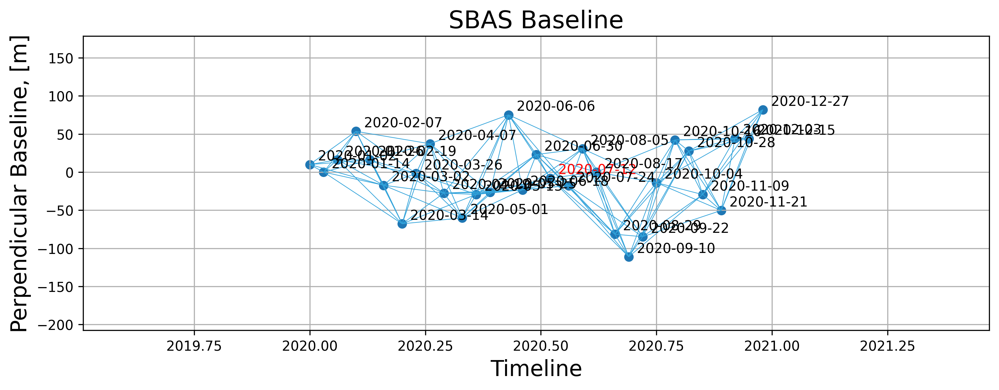

In [34]:
plt.figure(figsize=(12,4), dpi=300)
ax = plt.gca()

lines = [[(row.ref_timeline,row.ref_baseline),(row.rep_timeline,row.rep_baseline)]
         for row in baseline_pairs.itertuples()]
lc = matplotlib.collections.LineCollection(lines, colors='#30a2da', linewidths=0.5)
ax.add_collection(lc)
ax.autoscale()
ax.margins(0.5)
bs1 = baseline_pairs[['ref_timeline','ref_baseline','ref_date']].values
bs2 = baseline_pairs[['rep_timeline','rep_baseline','rep_date']].values
df = pd.DataFrame(np.concatenate([bs1, bs2]), columns=['timeline','baseline','date']).drop_duplicates()
plt.scatter(x=df.timeline, y=df.baseline)
for x,y,label in df.values:
    plt.annotate(label, (x,y), textcoords="offset points", xytext=(35,3), ha='center',
                 c='red' if label == master else 'black')
ax.set_xlabel('Timeline', fontsize=16)
ax.set_ylabel('Perpendicular Baseline, [m]', fontsize=16)
ax.set_title('SBAS Baseline', fontsize=18)
plt.grid()
plt.show()

In [35]:
# for production run
#assert master == sbas.master, f'ERROR: init SBAS using master image {master} and restart notebook'

## Build Interferogram

In [36]:
pairs = baseline_pairs[['ref_date', 'rep_date']]
pairs

,ref_date,rep_date
0,2020-01-02,2020-01-14
1,2020-01-02,2020-01-26
2,2020-01-02,2020-02-07
3,2020-01-02,2020-02-19
4,2020-01-02,2020-03-02
5,2020-01-14,2020-01-26
6,2020-01-14,2020-02-07
7,2020-01-14,2020-02-19
8,2020-01-14,2020-03-02
9,2020-01-14,2020-03-14


In [37]:
# miss optional "func" argument when post-processing is not required
# define a postprocessing function for decimation as func=decimator
# for 30m DEM use decimation x=2, y=2 (is equal to GMTSAR rdec=8, adec=2) or 4x4 for 60m DEM
decimator = lambda da: da.coarsen({'y': 2, 'x': 2}, boundary='trim').mean()

# default parameters: wavelength=200, psize=32, func=None (no postprocessing)
#, wavelength=200, func=decimator
sbas.intf_parallel(pairs, func=decimator)

Interferograms:   0%|          | 0/139 [00:00<?, ?it/s]

NOTE: build translation matrices for direct and inverse geocoding for subswath 2


Loading:   0%|          | 0/1 [00:00<?, ?it/s]

## Merge Subswaths (Optional)

In [38]:
# test on a single pair and grid
#sbas.merge(pairs.values[8], 'phasefilt', debug=True)

In [39]:
sbas.merge_parallel(pairs)

In [40]:
sbas.to_dataframe()

,datetime,orbit,mission,polarization,subswath,datapath,metapath,orbitpath,geometry
date,,,,,,,,,
2020-01-02,2020-01-02 14:44:58,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200102t144458-20200102t144507-030623-03823a-005.tiff,raw_asc/s1a-iw2-slc-vv-20200102t144458-20200102t144507-030623-03823a-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210316T184157_V20200101T225942_20200103T005942.EOF,"POLYGON ((47.46451 39.30777, 47.84950 37.54856, 48.93133 37.78531, 48.54634 39.54452, 47.46451 39.30777))"
2020-01-14,2020-01-14 14:44:58,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200114t144458-20200114t144506-030798-03885a-005.tiff,raw_asc/s1a-iw2-slc-vv-20200114t144458-20200114t144506-030798-03885a-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210316T223042_V20200113T225942_20200115T005942.EOF,"POLYGON ((47.46432 39.30797, 47.84929 37.54877, 48.93112 37.78551, 48.54615 39.54471, 47.46432 39.30797))"
2020-01-26,2020-01-26 14:44:58,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200126t144458-20200126t144506-030973-038e84-005.tiff,raw_asc/s1a-iw2-slc-vv-20200126t144458-20200126t144506-030973-038e84-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T022152_V20200125T225942_20200127T005942.EOF,"POLYGON ((47.46517 39.30759, 47.85009 37.54841, 48.93162 37.78506, 48.54670 39.54424, 47.46517 39.30759))"
2020-02-07,2020-02-07 14:44:57,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200207t144457-20200207t144506-031148-03949f-005.tiff,raw_asc/s1a-iw2-slc-vv-20200207t144457-20200207t144506-031148-03949f-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T061343_V20200206T225942_20200208T005942.EOF,"POLYGON ((48.92003 37.78443, 48.57084 39.38058, 47.50996 39.14850, 47.85914 37.55235, 48.92003 37.78443))"
2020-02-19,2020-02-19 14:44:57,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200219t144457-20200219t144505-031323-039aac-005.tiff,raw_asc/s1a-iw2-slc-vv-20200219t144457-20200219t144505-031323-039aac-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T100523_V20200218T225942_20200220T005942.EOF,"POLYGON ((48.91966 37.78403, 48.57044 39.38019, 47.50958 39.14808, 47.85880 37.55193, 48.91966 37.78403))"
2020-03-02,2020-03-02 14:44:57,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200302t144457-20200302t144505-031498-03a0af-005.tiff,raw_asc/s1a-iw2-slc-vv-20200302t144457-20200302t144505-031498-03a0af-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T135251_V20200301T225942_20200303T005942.EOF,"POLYGON ((48.91937 37.78395, 48.56998 39.38072, 47.50913 39.14860, 47.85851 37.55183, 48.91937 37.78395))"
2020-03-14,2020-03-14 14:44:57,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200314t144457-20200314t144505-031673-03a6c2-005.tiff,raw_asc/s1a-iw2-slc-vv-20200314t144457-20200314t144505-031673-03a6c2-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T173827_V20200313T225942_20200315T005942.EOF,"POLYGON ((48.91874 37.78379, 48.56944 39.38018, 47.50860 39.14807, 47.85789 37.55167, 48.91874 37.78379))"
2020-03-26,2020-03-26 14:44:57,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200326t144457-20200326t144505-031848-03aceb-005.tiff,raw_asc/s1a-iw2-slc-vv-20200326t144457-20200326t144505-031848-03aceb-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T212403_V20200325T225942_20200327T005942.EOF,"POLYGON ((48.91976 37.78363, 48.57056 39.37989, 47.50972 39.14782, 47.85892 37.55156, 48.91976 37.78363))"
2020-04-07,2020-04-07 14:44:57,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200407t144457-20200407t144506-032023-03b316-005.tiff,raw_asc/s1a-iw2-slc-vv-20200407t144457-20200407t144506-032023-03b316-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210318T011506_V20200406T225942_20200408T005942.EOF,"POLYGON ((48.92057 37.78384, 48.57134 39.38047, 47.51052 39.14844, 47.85976 37.55181, 48.92057 37.78384))"


## Dump

Save directory WORKDIR with the saved state and close the notebook. Continue work later on the same or another host using SBAS.restore() command. As interferograms as unwrapped phases can be loaded using restored SBAS object.

In [41]:
# dump current state into WORKDIR 
sbas.dump()
# restore the current state later of from other notebook to continue
# sbas = SBAS.restore(WORKDIR)

NOTE: save state to file raw_asc/SBAS.pickle


## Load and Display Top 50 Interferograms

In [42]:
# decimate to plot faster
phasefilts = sbas.open_grids(pairs[:50], 'phasefilt').coarsen({'x': 64, 'y': 64}, boundary='trim').mean()

Loading:   0%|          | 0/50 [00:00<?, ?it/s]

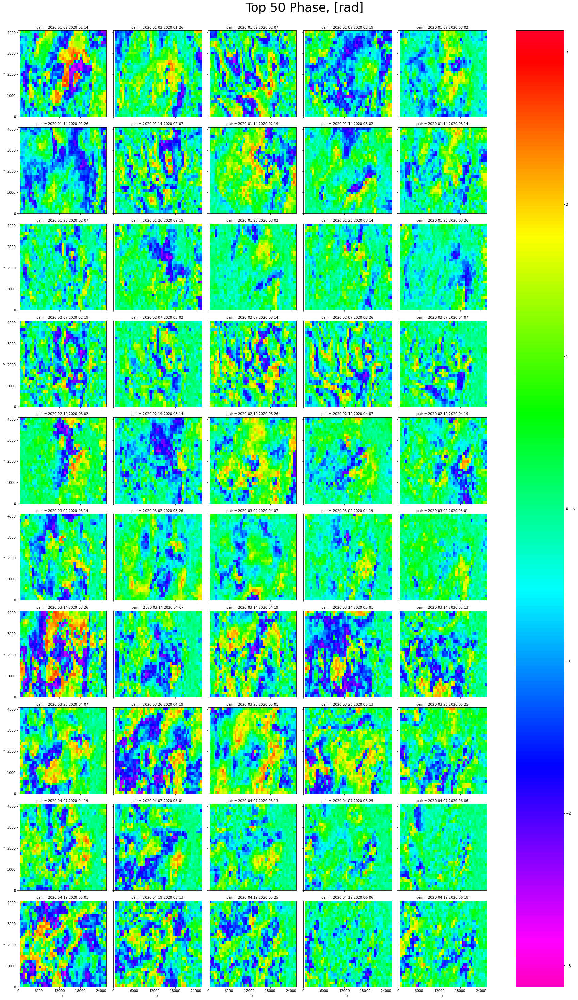

In [43]:
fg = phasefilts.plot.imshow(
    col='pair',
    col_wrap=5, size=4, aspect=1.2,
    vmin=-np.pi, vmax=np.pi, cmap='gist_rainbow_r'
)
fg.set_ticks(max_xticks=5, max_yticks=5, fontsize='medium')
fg.fig.suptitle('Top 50 Phase, [rad]', y=1.02, fontsize=36)
#plt.savefig(f'Phase, [rad].jpg', dpi=150, quality=95)
plt.show()

## Load and Display Top 50 Correlations

In [44]:
# decimate to plot faster
corrs = sbas.open_grids(pairs[:50], 'corr').coarsen({'x': 64, 'y': 64}, boundary='trim').mean()

Loading:   0%|          | 0/50 [00:00<?, ?it/s]

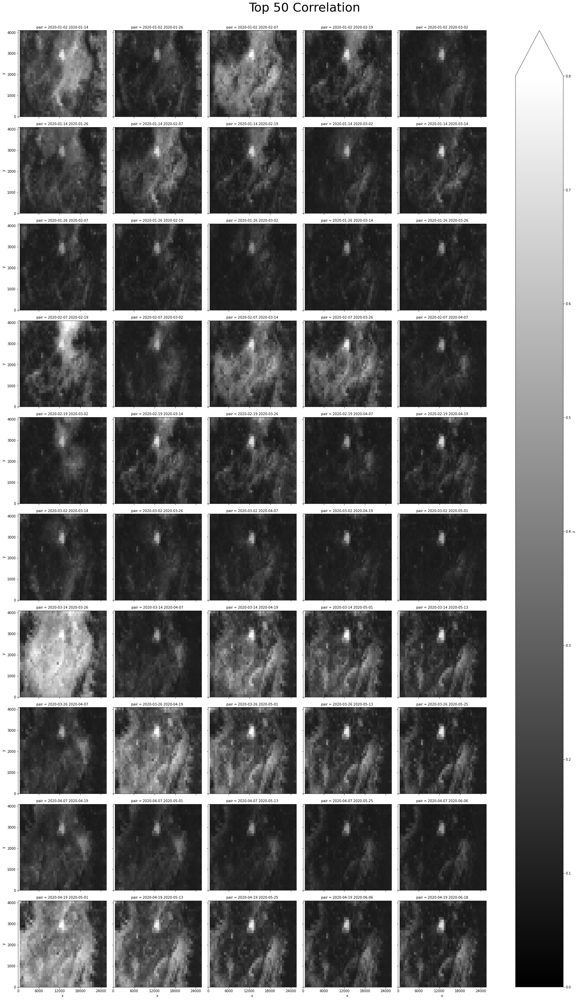

In [45]:
fg = corrs.plot.imshow(
    col='pair',
    col_wrap=5, size=4, aspect=1.2,
    vmin=-0, vmax=0.8, cmap='gray'
)
fg.set_ticks(max_xticks=5, max_yticks=5, fontsize='medium')
fg.fig.suptitle('Top 50 Correlation', y=1.02, fontsize=36)
#plt.savefig(f'Correlation.jpg', dpi=150, quality=95)
plt.show()

## Backup Pre-Processed Data (cropped GeoTIFF, orbits, DEM grid, landmask)

Save the stitched and cropped scenes and downloaded DEM and orbit files to a new directory using `SBAS.backup(dir)` command and load the dataset later as `SBAS(dir, 'dir/DEM_WGS84.nc', basedir=WORKDIR)` Do not forgot to download the backup to use it later.

Note: that's required to do the full processing using backaped data but DATADIR is not required more. For the example: backup size for 2021 year ascending orbit is just 18 GB vs 240 GB raw Sentinel-1 unpacked scenes.

In [46]:
if DATADIR != BACKUP:
    print ('Create backup to use it for the next reproducible runs without the original scenes downloading')
    sbas.backup(BACKUP)

Create backup to use it for the next reproducible runs without the original scenes downloading


## Check and Export Area in Geographic Coordinates

Check if AOI is well covered by computed interferograms area. Low-coherence areas would be cropped on the next step (unwrapping).

In [47]:
corr_stack_max_ll = sbas.intf_ra2ll(sbas.open_grids(pairs, 'corr').max(['pair']))
#.coarsen({'lat': 8, 'lon': 8}, boundary='trim').mean()

Loading:   0%|          | 0/139 [00:00<?, ?it/s]

/opt/homebrew/Cellar/jupyterlab/3.4.5/libexec/lib/python3.10/site-packages/dask/array/reductions.py:640: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)
/opt/homebrew/Cellar/jupyterlab/3.4.5/libexec/lib/python3.10/site-packages/dask/array/reductions.py:640: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)
/opt/homebrew/Cellar/jupyterlab/3.4.5/libexec/lib/python3.10/site-packages/dask/array/reductions.py:640: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)
/opt/homebrew/Cellar/jupyterlab/3.4.5/libexec/lib/python3.10/site-packages/dask/array/reductions.py:640: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)


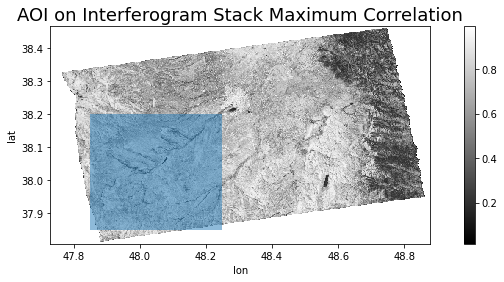

In [48]:
plt.figure(figsize=(12,4))
# decimate to plot faster
corr_stack_max_ll[::8,::8].plot(cmap='gray')
gpd.GeoSeries([AOI]).plot(alpha=0.5, ax=plt.gca())
plt.title('AOI on Interferogram Stack Maximum Correlation', fontsize=18)
plt.show()

In [49]:
# drop the existing file first
filename = f'{WORKDIR}.sample.nc'
!rm -fr {filename}
corr_stack_max_ll.to_netcdf(filename)
print ('Save file',filename)

Save file raw_asc.sample.nc


## Done

All the interferograms processed and unwrapped and project is dumped and can be restored later to continue the analysis. That's safer to create a new notebook for the post-processing because plotting a large timeseries requires a lot of RAM and the notebook can be out of RAM at any time.